# Dependancies

In [253]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)
from google.colab.patches import cv2_imshow

Mounted at /content/drive/


HoughLinesP(): It detects finite line segments in an image and provides the convenience of line detection through the use of some defined parameters.

cv2.Canny(): Applies the Canny edge detection algorithm for the identification and representation of edges in the image in a few steps.

Harris Corner Detector: This algorithm aims to locate corner points with a significant variation of intensity, matching the images and recognition of the object.

In [254]:
def get_line_intersection(first_segment, second_segment):
    # Unpacking points from the first and second line segments
    pt1_x, pt1_y, pt2_x, pt2_y = first_segment
    pt3_x, pt3_y, pt4_x, pt4_y = second_segment

    # Calculate the determinant to identify if lines intersect
    det_calc = (pt1_x - pt2_x) * (pt3_y - pt4_y) - (pt1_y - pt2_y) * (pt3_x - pt4_x)
    if det_calc == 0:  # Lines don't intersect if determinant is zero
        return None  # No intersection found

    # Determinant's reciprocal used for intersection coordinates calculation
    reciprocal = 1 / det_calc
    # Intersection X coordinate computation
    intersect_pt_x = ((pt1_x * pt2_y - pt1_y * pt2_x) * (pt3_x - pt4_x) - (pt1_x - pt2_x) * (pt3_x * pt4_y - pt3_y * pt4_x)) * reciprocal
    # Intersection Y coordinate computation
    intersect_pt_y = ((pt1_x * pt2_y - pt1_y * pt2_x) * (pt3_y - pt4_y) - (pt1_y - pt2_y) * (pt3_x * pt4_y - pt3_y * pt4_x)) * reciprocal

    # Return the intersection coordinates as a tuple, rounded to integers
    return (int(intersect_pt_x), int(intersect_pt_y))


1.Video file proj2_v2.mp4 read from Google Drive.

2.Frame dimensions retrieved.

3.VideoWriter initialized for new file proj2_v2_solution.mp4.

4.Frames converted to grayscale.

5.Binary mask created for segmentation.

6.Object boundaries identified by detecting contours.

7.Largest contour identified and used to create a new mask.

8.Blurry frames detected and skipped.

9.Canny edge detection applied.

10.Lines detected using Hough Transform.

11.Harris corner detection applied.

12.Intersection points of lines and corners marked.

13.Processed frames written to new video file.

14.Video capture and writer released; OpenCV windows destroyed.

15.Counts of processed and blurry frames removed reported.

In [255]:
# Initializing video capture
video_capture = cv2.VideoCapture("/content/drive/MyDrive/Colab Notebooks/proj2_v2.mp4")
vid_width = int(video_capture.get(3))
vid_height = int(video_capture.get(4))

# Setting up the video writer with output path and video properties
video_output = cv2.VideoWriter("/content/drive/MyDrive/Colab Notebooks/proj2_v2_solution.mp4", cv2.VideoWriter_fourcc(*'MP4V'), 10, (vid_width, vid_height))

# Initialize counters for blurry frames and total frames
count_blurry_frames = 0
count_total_frames = 0

# Laplacian kernel for edge detection
laplacian_filter = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])

# Processing frames in the loop
while video_capture.isOpened():
    count_total_frames += 1
    successful_frame_read, current_frame = video_capture.read()
    if not successful_frame_read:
        break

    # Converting the frame to grayscale for processing
    gray_frame = cv2.cvtColor(current_frame, cv2.COLOR_BGR2GRAY)
    threshold_mask = np.where(gray_frame > 155, 255, 0).astype(np.uint8)

    # Detecting contours on the threshold mask
    detected_contours, _ = cv2.findContours(threshold_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Assuming largest contour is the main object's boundary
    main_contour = max(detected_contours, key=cv2.contourArea)

    # Preparing mask for contour
    contour_mask = np.zeros_like(threshold_mask)
    cv2.drawContours(contour_mask, [main_contour], -1, (255), thickness=cv2.FILLED)

    # Applying Laplacian for blur detection
    laplacian_output = cv2.filter2D(gray_frame, -1, laplacian_filter)
    laplacian_variance = laplacian_output.var()
    if laplacian_variance < 48:  # Condition for blur detection
        count_blurry_frames += 1
        continue  # Skip further processing for this frame

    # Edge detection on the contour mask
    detected_edges = cv2.Canny(contour_mask, 10, 10, apertureSize=5)

    # Detecting lines using Probabilistic Hough Transform
    lines_detected = cv2.HoughLinesP(detected_edges, 1, np.pi/800, threshold=10, minLineLength=20, maxLineGap=100)

    # Drawing detected lines on the frame
    if lines_detected is not None:
        for line in lines_detected:
            x_start, y_start, x_end, y_end = line[0]
            cv2.line(current_frame, (x_start, y_start), (x_end, y_end), (255, 0, 0), 2)

    # Harris corner detection
    corner_response = cv2.cornerHarris(contour_mask,2,7,0.04)
    corner_response_dilated = cv2.dilate(corner_response,None)

    # Checking for intersections among lines for corner marking
    for i in range(len(lines_detected)):
        for j in range(i + 1, len(lines_detected)):
            point_of_intersection = find_intersection(lines_detected[i][0], lines_detected[j][0])
            if point_of_intersection:
                intersect_x, intersect_y = point_of_intersection
                if 0 <= intersect_x < current_frame.shape[1] and 0 <= intersect_y < current_frame.shape[0]:
                    if corner_response_dilated[intersect_y, intersect_x] > 0.0001 * corner_response_dilated.max():
                        cv2.circle(current_frame, (intersect_x, intersect_y), 10, (0, 0, 255), -1)

    video_output.write(current_frame)

# Releasing resources
video_capture.release()
video_output.release()
cv2.destroyAllWindows()

# Outputting final counts
print(f"Number of blurry frames excluded: {count_blurry_frames}")
print(f"Total Processed Frames: {count_total_frames}")


Number of blurry frames excluded: 169
Total Processed Frames: 387


# SIFT:

The Scale-Invariant Feature Transform (SIFT) is an algorithm in computer vision to detect and describe local features of an image. It is designed to be invariant to scaling, rotation, and somewhat invariant to changes of illumination and viewpoint. In SIFT, the process involves finding possible points of interest over scale space, refining these points with subpixel accuracy, assigning orientations to achieve rotation invariance, and finally, computing descriptors for the points of interest. The robustness of SIFT features makes them highly useful for tasks like object recognition, image stitching, and navigation, where consistent feature identification in varying conditions is crucial.

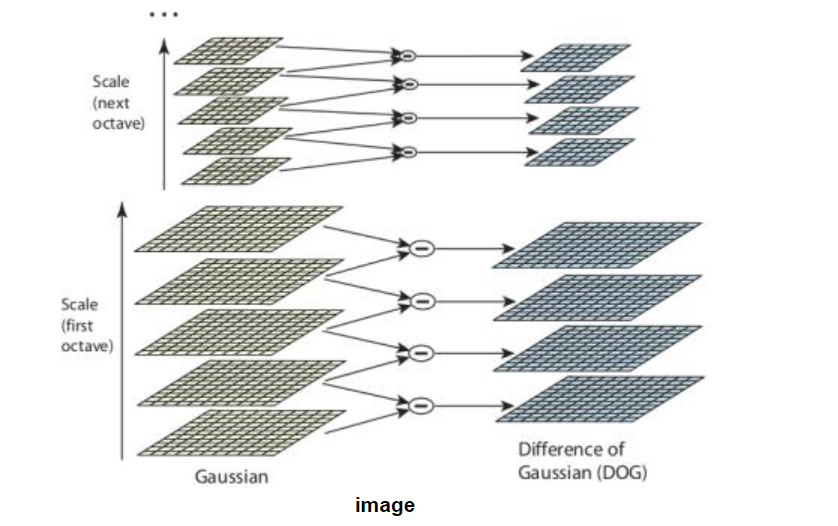

Justification:
SIFT is scale invariant. That is it can extract features between images even when the images are skewed in scale, aciant transformation sense. In contrast, harris corner detector cannot find corner of a the image it could before if the image was scaled positively.

In [256]:
def obtain_keypoints_and_descriptors(photo):
    # Utilizing the SIFT algorithm to identify and describe image features.
    sift_engine = cv2.SIFT_create()
    detected_keypoints, features_descriptor = sift_engine.detectAndCompute(photo, None)
    print("-------Key Features Extraction Process-------")
    # Visual representation of detected keypoints
    visualized_keypoints = cv2.drawKeypoints(photo, detected_keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    cv2_imshow(visualized_keypoints)

    return detected_keypoints, features_descriptor


In [257]:
def find_feature_matches(descriptor_set1, descriptor_set2, keypoints1, keypoints2):
    # Compares and matches feature descriptors between two images.
    matched_pairs = []  # To store the matched features after comparison

    # Choosing the matching strategy based on input

    brute_force_matcher = cv2.BFMatcher()
    all_matches = brute_force_matcher.knnMatch(descriptor_set1, descriptor_set2, k=2)

    # Implementing the Lowe's ratio test to filter good matches
    for first_match, second_match in all_matches:
        if first_match.distance < 0.75 * second_match.distance:
            matched_pairs.append(first_match)

    return matched_pairs


# **HOMOGRAPHY:**

Homography can be defined as a transformation that maps points in the source plane onto another, capturing the change of perspective. It is crucial in panorama generation, where multiple images taken from different angles are stitched into one smooth panoramic image. This process registers and orthorectifies the images, aligning and transforming them for a perfect fit, while accounting for viewpoint differences through corrections for rotation, scale, and translation. Thus, homography is essential for producing wide-angle or 360-degree panoramic views from a series of overlapping photographs, enabling immersive visual experiences.

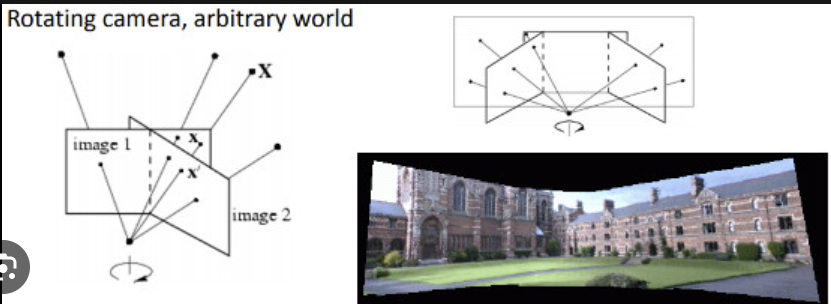

In [258]:
def compute_homography_manual(kp1, kp2, matches, iterations=1000, threshold=5.0):

    # Manually compute the homography between two images using RANSAC.

    # param kp1: Keypoints from image 1
    # param kp2: Keypoints from image 2
    # param matches: Matched keypoints
    # param iterations: Number of RANSAC iterations
    # param threshold: Threshold for considering a point as an inlier
    # return: The best homography matrix found

    max_inliers = []
    best_homography = None

    for _ in range(iterations):
        # Randomly select 4 matches
        np.random.shuffle(matches)
        selected_matches = matches[:4]

        # Construct pairs of points
        src_pts = np.float32([kp1[m.queryIdx].pt for m in selected_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in selected_matches]).reshape(-1, 1, 2)

        # Estimate homography using the Direct Linear Transform (DLT) method
        A = []
        for i in range(4):
            x, y = src_pts[i][0]
            x_prime, y_prime = dst_pts[i][0]
            A.append([-x, -y, -1, 0, 0, 0, x*x_prime, y*x_prime, x_prime])
            A.append([0, 0, 0, -x, -y, -1, x*y_prime, y*y_prime, y_prime])

        A = np.array(A)
        U, S, Vt = np.linalg.svd(A)
        H = Vt[-1].reshape(3, 3)

        # Apply homography and count inliers
        inliers = []
        for match in matches:
            pt1 = np.append(np.array(kp1[match.queryIdx].pt), 1)
            pt2 = np.array(kp2[match.trainIdx].pt)
            projected_pt1 = np.dot(H, pt1)

            # Normalize
            projected_pt1 = (projected_pt1 / projected_pt1[2])[:2]

            # Calculate error
            if np.linalg.norm(projected_pt1 - pt2) < threshold:
                inliers.append(match)

        # Update best model if current model is better
        if len(inliers) > len(max_inliers):
            max_inliers = inliers
            best_homography = H

    return best_homography


In [259]:
def stitch_images(image1, image2, H):
      # Stitch two images using the computed homography matrix.

    result = cv2.warpPerspective(image1, H, (image1.shape[1] + image2.shape[1], image1.shape[0]))
    result[0:image2.shape[0], 0:image2.shape[1]] = image2
    return result


In [260]:
def create_panorama(images):
    """
    Create a panorama from a list of images.
    """
    # Start with the first image as the current base for the panorama.
    current_image = images[0]

    # Iterate through the rest of the images to stitch them to the current image.
    for i in range(1, len(images)):
        # Extract keypoints and descriptors from the current base image.
        kp1, des1 = extract_features(current_image)
        # Extract keypoints and descriptors from the next image to be stitched.
        kp2, des2 = extract_features(images[i])

        # Match features between the current base image and the next image.
        matches = find_feature_matches(des1, des2, kp1, kp2)
        # Optionally, visualize and save the matches between the two images.
        print("-----------------------feature matching-----------------------")
        visualize_matches(current_image, kp1, images[i], kp2, matches, f'matches_{i-1}_{i}.jpg')

        # Compute the homography matrix based on the matched features.
        H = compute_homography_manual(kp1, kp2, matches)
        # Stitch the next image to the current base image using the homography matrix.
        current_image = stitch_images(current_image, images[i], H)

    # Return the final stitched panorama image.
    return current_image


In [261]:

# Function to visualize and save matches between two images
def visualize_matches(image1, kp1, image2, kp2, matches, output_path):
    match_visualization = cv2.drawMatches(image1, kp1, image2, kp2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    cv2_imshow(match_visualization)
    # plt.show()


-----------------------feature extraction-----------------------


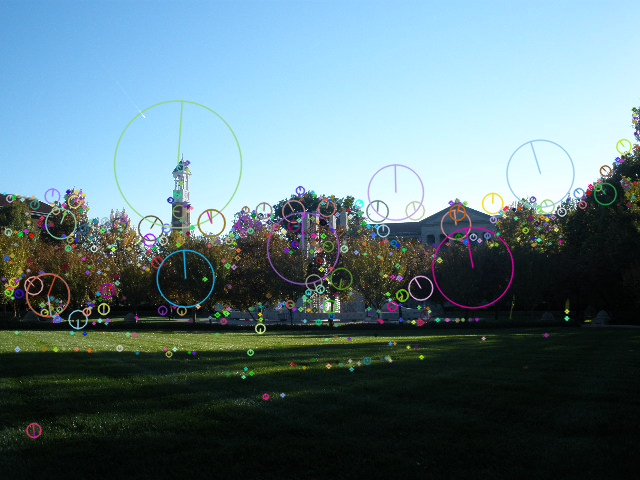

-----------------------feature extraction-----------------------


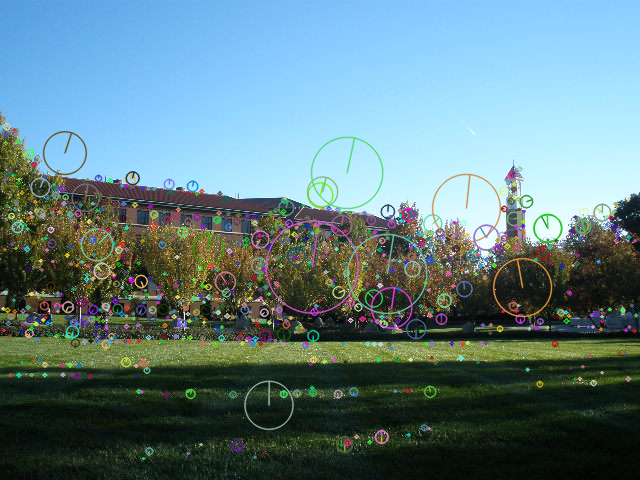

-----------------------feature matching-----------------------


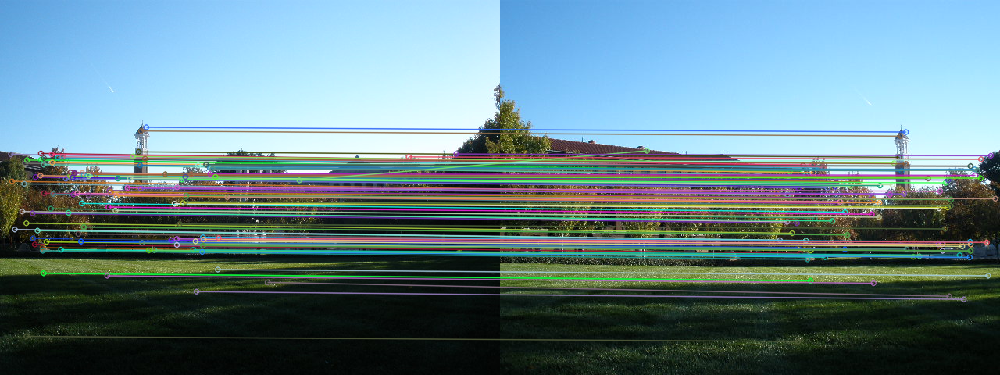

-----------------------feature extraction-----------------------


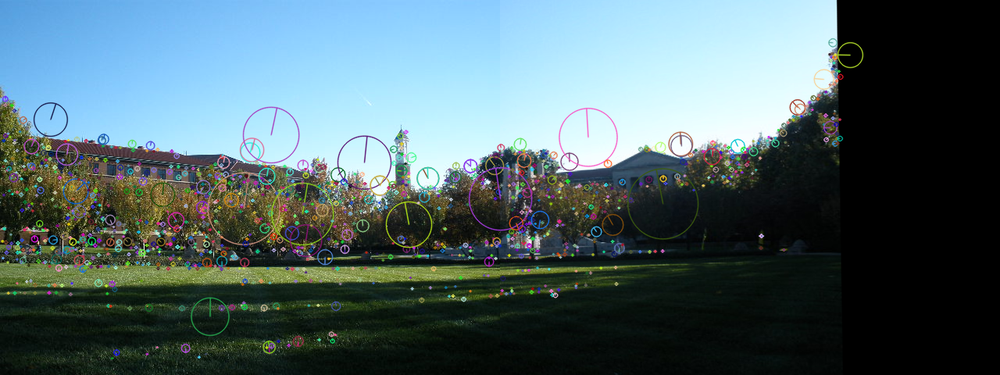

-----------------------feature extraction-----------------------


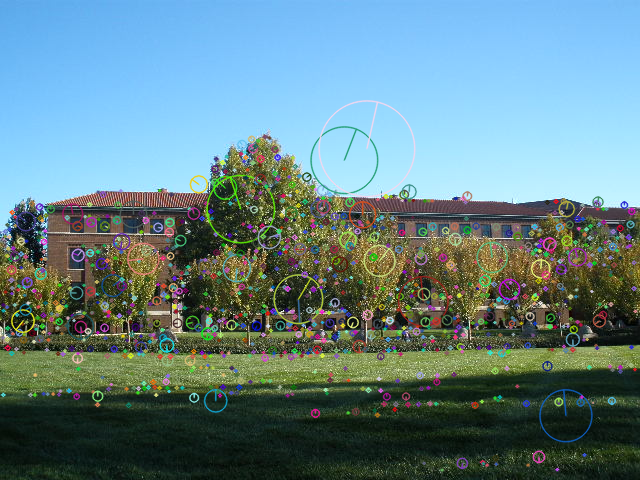

-----------------------feature matching-----------------------


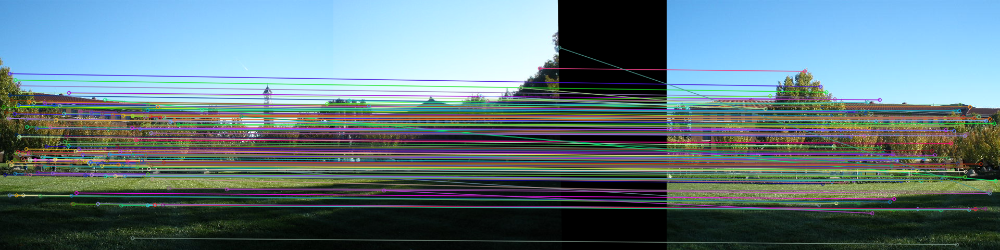

-----------------------feature extraction-----------------------


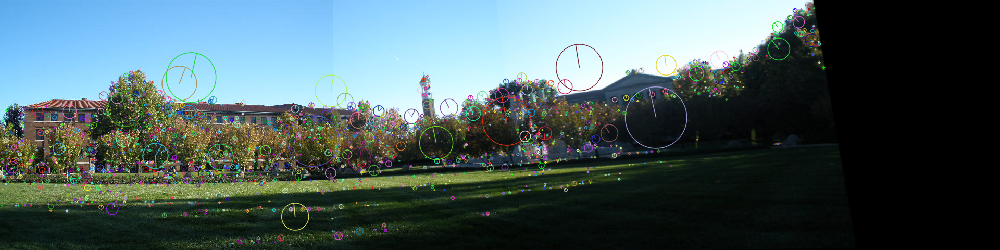

-----------------------feature extraction-----------------------


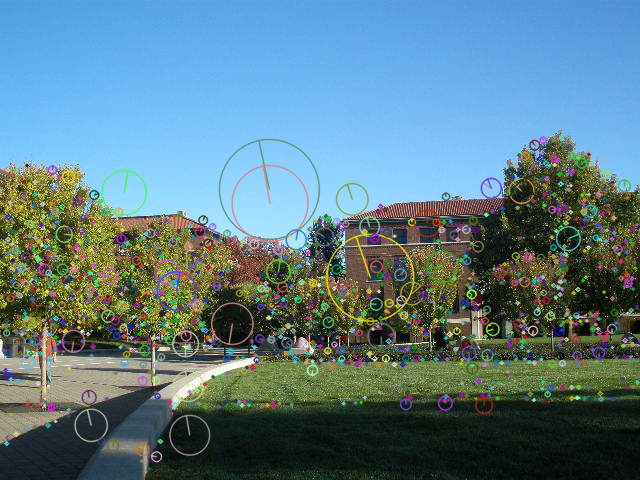

-----------------------feature matching-----------------------


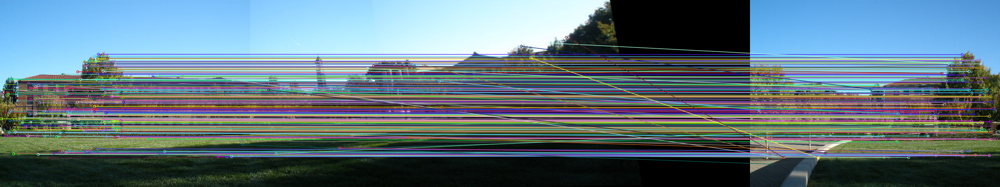

-----------------------Panorama-----------------------


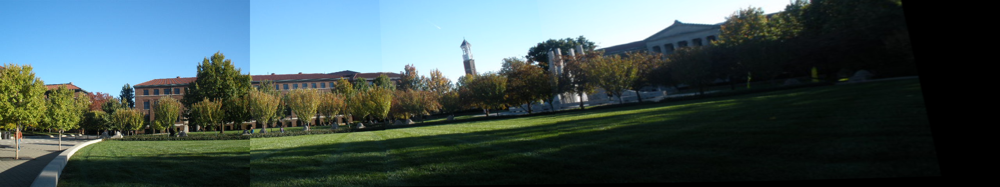

In [262]:
# Step 4: Load images and create panorama (pseudo code, images need to be loaded properly)
image_paths = ["/content/drive/MyDrive/Colab Notebooks/PA120272.JPG", "/content/drive/MyDrive/Colab Notebooks/PA120273.JPG", "/content/drive/MyDrive/Colab Notebooks/PA120274.JPG", "/content/drive/MyDrive/Colab Notebooks/PA120275.JPG"]
images = [cv2.imread(image_path) for image_path in image_paths]
panorama = create_panorama(images)
print("-----------------------Panorama-----------------------")
cv2_imshow(panorama)

# **(B)**

Panoramic mosaicing achieves optimal results when the camera pivots solely around its central axis due to the principles of image transformation and alignment. This preference is intricately tied to how homography matrices, which are pivotal in merging multiple images into a seamless panorama, are computed. Here's an alternate explanation focusing on the impact on homography:


Ease of Calculation with Central Rotation: Rotating the camera around its center point keeps the transformation between images straightforward—largely rotational with minimal, if any, translational shifts. This uniformity significantly simplifies the homography matrix's computation, allowing for accurate alignment of images based on rotation alone, thereby avoiding complex compensations for shifts in perspective.

Avoidance of Parallax Distortions: Central rotation of the camera minimizes parallax, which is the variation in the apparent position of an object viewed along two different lines of sight. Parallax introduces stitching errors and inconsistencies in the panorama. By maintaining a fixed rotation point, distant objects maintain their relative positions across images, simplifying the creation of a consistent homography matrix and enhancing the mosaic's quality.

Simplification of Image Stitching Tasks: If the camera's movement includes translations or shifts away from its center, the resulting homography must compensate for rotation, translation, and possibly variations in camera parameters. This complexity increases the risk of inaccuracies, such as distorted seams or misaligned features in the panorama. Keeping the camera's movement restricted to its central axis narrows down the variables, making the homography matrix easier and more accurate to compute.